<a href="https://colab.research.google.com/github/asamiei/HER2/blob/main/HER2_Feb_3_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install opencv-python -U
import numpy as np 
import pandas as pd 
import tensorflow as tf
import os
import random
import numpy as np
from tqdm import tqdm
from zipfile import ZipFile 
from skimage.io import imread,imshow
from skimage.transform import resize
import matplotlib.pyplot as plt
import datetime
import h5py
from keras.models import load_model
from skimage import measure, color, io
import joblib
import os
import glob
import cv2
import numpy as np
from matplotlib import pyplot as plt
import seaborn
import sys
import scipy
import skimage
from skimage.measure import label, regionprops, regionprops_table
from skimage import measure
import pandas as pd
from sklearn.neighbors import LocalOutlierFactor
from sklearn.metrics import mean_absolute_error
from skimage import measure, io, img_as_ubyte
from skimage.color import label2rgb, rgb2gray
from skimage.segmentation import clear_border
np.set_printoptions(threshold=sys.maxsize)
# need the updated version of scikit image 
!pip install scikit-image==0.18.3 


import matplotlib
from matplotlib import pyplot as plt


     |████████████████████████████████| 60.4 MB 1.6 MB/s 
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.1.2.30
    Uninstalling opencv-python-4.1.2.30:
      Successfully uninstalled opencv-python-4.1.2.30
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


## Installing cellpose library and setting up GPU setting

In [ ]:
!pip install cellpose==0.6.5


#disabled installation and import of mxnet as pytorch is the default neural net
import numpy as np
import time, os, sys, random
from urllib.parse import urlparse
import skimage.io
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 300

from urllib.parse import urlparse
import shutil

#from tifffile import imread, imsave

print ("Downloading Models")
from cellpose import models


#Check if colab notebook instance has GPU access
if models.use_gpu()==False: 
  #Warnings from the ZeroCost StarDist notebook
  print('Did you change your runtime ?') 
  print('If the runtime setting is correct then Google did not allocate a GPU for your session')
  print('Expect slow performance. To access GPU try reconnecting later')
  use_GPU=False
else:

  print("*************************************************")
  !nvidia-smi
  use_GPU=True

print("*************************************************")
print("Libraries imported and configured")


     |████████████████████████████████| 13.3 MB 5.7 MB/s 
     |████████████████████████████████| 47.7 MB 1.3 MB/s 
  Created wheel for cellpose: filename=cellpose-0.6.5-py3-none-any.whl size=152511 sha256=85e0487235f0cc84fea11d8dceba15d0d9d6bf6f83c09d3c6f46c358a38c6401
  Stored in directory: /root/.cache/pip/wheels/0e/6a/fc/e28edbe6b2f78b3ee4c011e97236b996818d86bec88e78dc64
Successfully built cellpose


creating new log file
2022-02-06 08:17:00,284 [INFO] WRITING LOG OUTPUT TO /root/.cellpose/run.log
2022-02-06 08:17:00,303 [INFO] Downloading: "https://www.cellpose.org/models/cyto_0" to /root/.cellpose/models/cyto_0



100%|██████████| 25.2M/25.2M [00:00<00:00, 27.9MB/s]

2022-02-06 08:17:01,651 [INFO] Downloading: "https://www.cellpose.org/models/cyto_1" to /root/.cellpose/models/cyto_1




100%|██████████| 25.2M/25.2M [00:00<00:00, 26.9MB/s]

2022-02-06 08:17:02,901 [INFO] Downloading: "https://www.cellpose.org/models/cyto_2" to /root/.cellpose/models/cyto_2




100%|██████████| 25.2M/25.2M [00:00<00:00, 27.5MB/s]

2022-02-06 08:17:04,129 [INFO] Downloading: "https://www.cellpose.org/models/cyto_3" to /root/.cellpose/models/cyto_3




100%|██████████| 25.2M/25.2M [00:00<00:00, 27.3MB/s]

2022-02-06 08:17:05,365 [INFO] Downloading: "https://www.cellpose.org/models/size_cyto_0.npy" to /root/.cellpose/models/size_cyto_0.npy




100%|██████████| 3.55k/3.55k [00:00<00:00, 9.34MB/s]

2022-02-06 08:17:05,765 [INFO] Downloading: "https://www.cellpose.org/models/cytotorch_0" to /root/.cellpose/models/cytotorch_0




100%|██████████| 25.3M/25.3M [00:00<00:00, 27.8MB/s]

2022-02-06 08:17:06,983 [INFO] Downloading: "https://www.cellpose.org/models/cytotorch_1" to /root/.cellpose/models/cytotorch_1




100%|██████████| 25.3M/25.3M [00:00<00:00, 27.9MB/s]

2022-02-06 08:17:08,200 [INFO] Downloading: "https://www.cellpose.org/models/cytotorch_2" to /root/.cellpose/models/cytotorch_2




100%|██████████| 25.3M/25.3M [00:00<00:00, 27.8MB/s]

2022-02-06 08:17:09,418 [INFO] Downloading: "https://www.cellpose.org/models/cytotorch_3" to /root/.cellpose/models/cytotorch_3




100%|██████████| 25.3M/25.3M [00:00<00:00, 27.3MB/s]

2022-02-06 08:17:10,660 [INFO] Downloading: "https://www.cellpose.org/models/size_cytotorch_0.npy" to /root/.cellpose/models/size_cytotorch_0.npy




100%|██████████| 5.23k/5.23k [00:00<00:00, 11.7MB/s]

2022-02-06 08:17:10,975 [INFO] Downloading: "https://www.cellpose.org/models/cyto2torch_0" to /root/.cellpose/models/cyto2torch_0




100%|██████████| 25.3M/25.3M [00:00<00:00, 27.4MB/s]

2022-02-06 08:17:12,212 [INFO] Downloading: "https://www.cellpose.org/models/cyto2torch_1" to /root/.cellpose/models/cyto2torch_1




100%|██████████| 25.3M/25.3M [00:00<00:00, 27.8MB/s]

2022-02-06 08:17:13,428 [INFO] Downloading: "https://www.cellpose.org/models/cyto2torch_2" to /root/.cellpose/models/cyto2torch_2




100%|██████████| 25.3M/25.3M [00:00<00:00, 27.4MB/s]

2022-02-06 08:17:14,664 [INFO] Downloading: "https://www.cellpose.org/models/cyto2torch_3" to /root/.cellpose/models/cyto2torch_3




100%|██████████| 25.3M/25.3M [00:00<00:00, 27.5MB/s]

2022-02-06 08:17:15,897 [INFO] Downloading: "https://www.cellpose.org/models/size_cyto2torch_0.npy" to /root/.cellpose/models/size_cyto2torch_0.npy




100%|██████████| 3.54k/3.54k [00:00<00:00, 4.81MB/s]

2022-02-06 08:17:16,115 [INFO] Downloading: "https://www.cellpose.org/models/nuclei_0" to /root/.cellpose/models/nuclei_0




100%|██████████| 25.2M/25.2M [00:00<00:00, 27.5MB/s]

2022-02-06 08:17:17,492 [INFO] Downloading: "https://www.cellpose.org/models/nuclei_1" to /root/.cellpose/models/nuclei_1




100%|██████████| 25.2M/25.2M [00:00<00:00, 27.6MB/s]

2022-02-06 08:17:18,826 [INFO] Downloading: "https://www.cellpose.org/models/nuclei_2" to /root/.cellpose/models/nuclei_2




100%|██████████| 25.2M/25.2M [00:00<00:00, 27.4MB/s]

2022-02-06 08:17:20,057 [INFO] Downloading: "https://www.cellpose.org/models/nuclei_3" to /root/.cellpose/models/nuclei_3




100%|██████████| 25.2M/25.2M [00:00<00:00, 27.5MB/s]

2022-02-06 08:17:21,284 [INFO] Downloading: "https://www.cellpose.org/models/size_nuclei_0.npy" to /root/.cellpose/models/size_nuclei_0.npy




100%|██████████| 3.55k/3.55k [00:00<00:00, 5.31MB/s]

2022-02-06 08:17:21,524 [INFO] Downloading: "https://www.cellpose.org/models/nucleitorch_0" to /root/.cellpose/models/nucleitorch_0




100%|██████████| 25.3M/25.3M [00:00<00:00, 27.4MB/s]

2022-02-06 08:17:22,758 [INFO] Downloading: "https://www.cellpose.org/models/nucleitorch_1" to /root/.cellpose/models/nucleitorch_1




100%|██████████| 25.3M/25.3M [00:00<00:00, 27.4MB/s]

2022-02-06 08:17:24,000 [INFO] Downloading: "https://www.cellpose.org/models/nucleitorch_2" to /root/.cellpose/models/nucleitorch_2




100%|██████████| 25.3M/25.3M [00:00<00:00, 27.4MB/s]

2022-02-06 08:17:25,235 [INFO] Downloading: "https://www.cellpose.org/models/nucleitorch_3" to /root/.cellpose/models/nucleitorch_3




100%|██████████| 25.3M/25.3M [00:00<00:00, 27.7MB/s]

2022-02-06 08:17:26,527 [INFO] Downloading: "https://www.cellpose.org/models/size_nucleitorch_0.npy" to /root/.cellpose/models/size_nucleitorch_0.npy




100%|██████████| 3.54k/3.54k [00:00<00:00, 10.3MB/s]


2022-02-06 08:17:36,713 [INFO] ** TORCH CUDA version installed and working. **
*************************************************
Sun Feb  6 08:17:36 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P0    32W / 250W |   1003MiB / 16280MiB |      2%      Default |
|                               |                      |                  N/A |
+-------------------------------+------

# **Input image here:**
### ideal size is 512 x 512 for fast GPU processing

In [ ]:
path = "/content/1644130876976.jpeg"

image = cv2.imread(path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


# Bring down the value of all foreground (objects) to 1 and keep the background 0
#image = np.where(image < 1, 235, image)

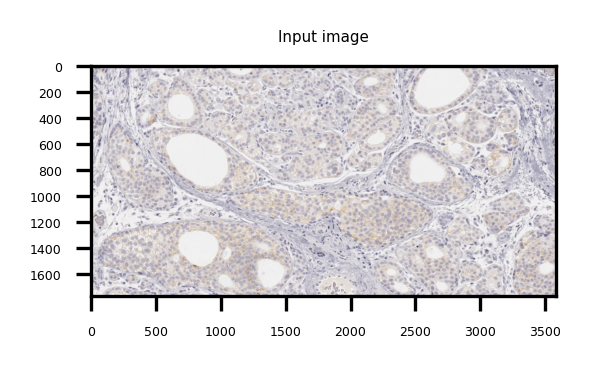

In [ ]:
matplotlib.rcParams.update({'font.size': 3})
plt.figure(figsize= (2,2))
plt.title("Input image")
plt.imshow(image)
plt.show()

alpha 1.0039370078740157
beta 0.0


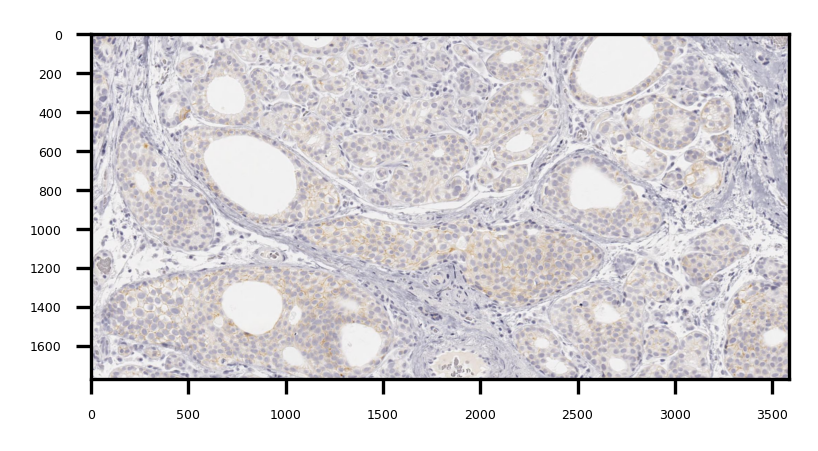

In [ ]:
# https://stackoverflow.com/questions/56905592/automatic-contrast-and-brightness-adjustment-of-a-color-photo-of-a-sheet-of-pape/56909036
# Automatic brightness and contrast optimization with optional histogram clipping

def automatic_brightness_and_contrast(image, clip_hist_percent = 0):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Calculate grayscale histogram
    hist = cv2.calcHist([gray],[0],None,[256],[0,256])
    hist_size = len(hist)
    
    # Calculate cumulative distribution from the histogram
    accumulator = []
    accumulator.append(float(hist[0]))
    for index in range(1, hist_size):
        accumulator.append(accumulator[index -1] + float(hist[index]))
    
    # Locate points to clip
    maximum = accumulator[-1]
    clip_hist_percent *= (maximum/100.0)
    clip_hist_percent /= 2.0
    
    # Locate left cut
    minimum_gray = 0
    while accumulator[minimum_gray] < clip_hist_percent:
        minimum_gray += 1
    
    # Locate right cut
    maximum_gray = hist_size -1
    while accumulator[maximum_gray] >= (maximum - clip_hist_percent):
        maximum_gray -= 1
    
    # Calculate alpha and beta values
    alpha = 255 / (maximum_gray - minimum_gray)
    beta = -minimum_gray * alpha
    

    auto_result = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    return (auto_result, alpha, beta)


image_auto_corrected, alpha, beta = automatic_brightness_and_contrast(image)
print('alpha', alpha)
print('beta', beta)

matplotlib.rcParams.update({'font.size': 3})
plt.figure(figsize=(3,3))
plt.imshow(image_auto_corrected)
plt.show()


#Separate colors in immunohistochemical staining¶
https://scikit-image.org/docs/dev/auto_examples/color_exposure/plot_ihc_color_separation.html

https://github.com/scikit-image/scikit-image/issues/5164

<Figure size 600x600 with 0 Axes>

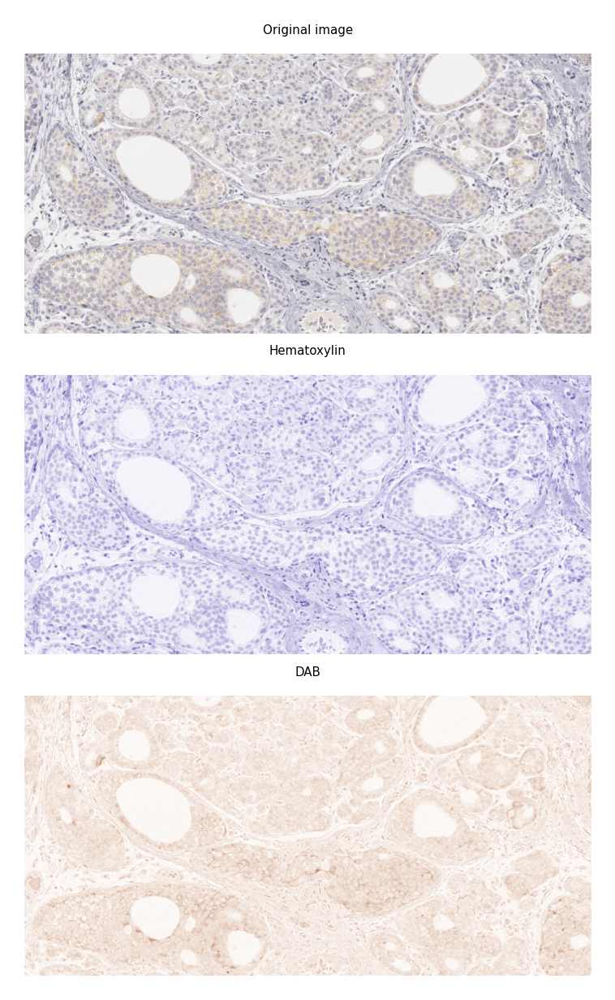

In [ ]:
plt.figure(figsize= (2,2))

# Note that we have to convert to RGB b/c before this, I was making the conversion in the H&E normalization section, which I am not using here for DAB
from skimage import color
from skimage import io


import numpy as np
import matplotlib.pyplot as plt

from skimage import data
from skimage.color import rgb2hed, hed2rgb

# Separate the stains from the IHC image

ihc_hed = rgb2hed(image_auto_corrected)

# Create an RGB image for each of the stains
null = np.zeros_like(ihc_hed[:, :, 0])
ihc_h = hed2rgb(np.stack((ihc_hed[:, :, 0], null, null), axis=-1))
ihc_e = hed2rgb(np.stack((null, ihc_hed[:, :, 1], null), axis=-1))
ihc_d = hed2rgb(np.stack((null, null, ihc_hed[:, :, 2]), axis=-1))

# Display
fig, axes = plt.subplots(3,1, figsize=(4,4), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(image_auto_corrected)
ax[0].set_title("Original image")

ax[1].imshow(ihc_h)
ax[1].set_title("Hematoxylin")

# ax[2].imshow(ihc_e)
# ax[2].set_title("Eosin") 

ax[2].imshow(ihc_d)
ax[2].set_title("DAB")

for a in ax.ravel():
    a.axis('off')

fig.tight_layout()

# Counting Total cells (using original image, non-deconvulved image)

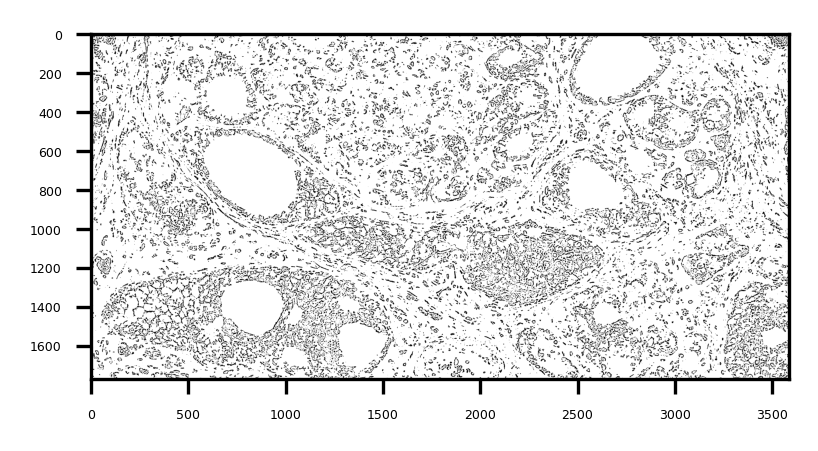

In [ ]:
# turning ihc_h into grayscale to see if it imrpoves cell-pose output
ihc_d_ = (ihc_d * 255).astype(np.uint8)
ihc_h_ = (ihc_h * 255).astype(np.uint8)
ihc_e_ = (ihc_e * 255).astype(np.uint8)


"""
alpha 1  beta 0      --> no change  
0 < alpha < 1        --> lower contrast  
alpha > 1            --> higher contrast  
-127 < beta < +127   --> good range for brightness values

alpha = 1 # Contrast control (1.0-3.0)
beta = 0 # Brightness control (0-100)
ihc_d_ = cv2.convertScaleAbs(ihc_d_, alpha=alpha, beta=beta)
"""

im_gray = cv2.cvtColor(ihc_d_.astype(np.uint8), cv2.COLOR_RGB2GRAY)
im_gray = np.where(im_gray > 225, 255, im_gray) # Eliminate background noise

#CLAHE
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
im_gray_clahe = clahe.apply(im_gray)

# Adaptive Gaussian
im_gray_clahe_enhanced = cv2.adaptiveThreshold(im_gray_clahe, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,11,7)


plt.figure(figsize=(3,3))
plt.imshow(im_gray_clahe_enhanced, cmap = 'gray')
plt.show()


In [ ]:
np.max(im_gray_clahe_enhanced)

255

# Using Scikit image Region Props

In [ ]:
from skimage.measure import label, regionprops, regionprops_table
from skimage import measure
from skimage import measure, img_as_ubyte
from skimage.color import label2rgb, rgb2gray
from skimage.segmentation import clear_border

def predict_generate_cell_properties(input_cell_mask, input_image):    
    # Label each region/cell 
    #masks, total_cell_count = cell_pose(masks_cell_type[:, :, 2])
    masks = skimage.measure.label(input_cell_mask, background= 0, return_num= False, connectivity = 2)

    # Get properties of each region/cell
    cell_props = regionprops_table((masks), input_image, properties= ['label','area','bbox', 'centroid', 'minor_axis_length', 'major_axis_length', 'mean_intensity'])
    df = pd.DataFrame(cell_props)
    df.tail()

    return df



In [ ]:
# Ihc_d_dataframe = predict_generate_cell_properties(ihc_d_thresh, ihc_d_)

# if len(Ihc_d_dataframe) > 10 and Ihc_d_dataframe.area.mean() < 3000:
#     print("Positive: score 3")
#     print("\n")
#     Exit_command = input('Would you like to continue (Y/N): ')


In [ ]:
image_  = cv2.bitwise_not(ihc_h_)
image_  = cv2.cvtColor(image_ .astype(np.uint8), cv2.COLOR_RGB2GRAY) 

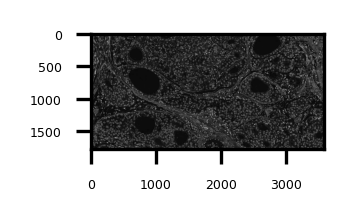

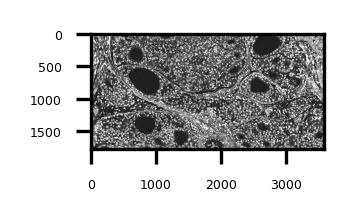

In [ ]:
alpha = 3.0 # Contrast control (1.0-3.0)
beta = 0 # Brightness control (0-100)

adjusted = cv2.convertScaleAbs(image_, alpha=alpha, beta=beta)

matplotlib.rcParams.update({'font.size': 3})
plt.figure(figsize=(1,1))
plt.imshow(image_, cmap = 'gray')
plt.show()

matplotlib.rcParams.update({'font.size': 3})
plt.figure(figsize=(1,1))
plt.imshow(adjusted, cmap = 'gray')
plt.show()

2022-02-06 08:17:51,023 [INFO] ** TORCH CUDA version installed and working. **
2022-02-06 08:17:51,028 [INFO] >>>> using GPU
2022-02-06 08:17:51,303 [INFO] ~~~ ESTIMATING CELL DIAMETER(S) ~~~
2022-02-06 08:18:02,043 [INFO] estimated cell diameter(s) in 10.74 sec
2022-02-06 08:18:02,044 [INFO] >>> diameter(s) = 
2022-02-06 08:18:02,047 [INFO] [ 19.77 ]
2022-02-06 08:18:02,048 [INFO] ~~~ FINDING MASKS ~~~


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:4004: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  "Default grid_sample and affine_grid behavior has changed "


2022-02-06 08:18:14,865 [INFO] >>>> TOTAL TIME 23.56 sec


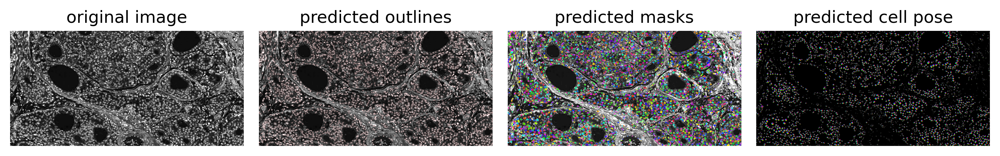

In [ ]:
import numpy as np
import time, os, sys
from urllib.parse import urlparse
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 300
from cellpose import utils, io


#!pip install cellpose

from cellpose import models, io

# DEFINE CELLPOSE MODEL
# model_type='cyto' or model_type='nuclei'
model = models.Cellpose(gpu= True, model_type='nuclei')

# define CHANNELS to run segementation on
# grayscale=0, R=1, G=2, B=3
# channels = [cytoplasm, nucleus]
# if NUCLEUS channel does not exist, set the second channel to 0
# channels = [0,0]
# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
channels = [0,0] # IF YOU HAVE GRAYSCALE
# channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus

masks, flows, styles, diams = model.eval(image_, diameter= None, channels = channels)


# DISPLAY RESULTS
from cellpose import plot


fig = plt.figure(figsize=(10,5))
plot.show_segmentation(fig, image_, masks, flows[0], channels=channels)
plt.tight_layout()
plt.show()

In [ ]:
total_cells = np.max(masks)
print("total cell count = ", total_cells)

total cell count =  2746


# Counting the cells on the mask generated by cellpose: 
 Since each cell/instance gets assigned a unique integer for it's pixels, the largest (max) value of the pixel in the masks array will also be reflective of the total cell/instance count

In [ ]:
# after cleaning the mask, the "pixel value" of each object in the cleaned mask is no longer the true number of cells. We will need to recount the numbner of cells
values = np.unique(masks)

print("cell count:", len(values))

cell count: 2747


# Eliminate cells sitting on the border using Scikit image

In [ ]:
from skimage.segmentation import clear_border
from skimage.segmentation import expand_labels
from skimage.morphology import binary_erosion

# remove cells from border of mask
nuclei_cleared = clear_border(masks)

# # To erode mask, we need to use binary mask (0,1). First we transform mask into binary. Then we multiple the eroded binary mask with the true mask to recreate the eroded mask with normal pixel numbers.
# nuclei_cleared_binary = np.where(nuclei_cleared > 1, 1, nuclei_cleared)
# nuclei_cleared_binary_erosion = binary_erosion(nuclei_cleared_binary)
# # # for i in range(3):  # how many times we like to erode a one layer pixel off of each cell
# # #     nuclei_cleared_binary_erosion = binary_erosion(nuclei_cleared_binary_erosion)
# nuclei_cleared_binary_erosion = np.multiply(nuclei_cleared_binary_erosion, nuclei_cleared)



# https://scikit-image.org/docs/dev/auto_examples/segmentation/plot_expand_labels.html
# dilate the true mask
nuclei_cleared_dilated = expand_labels(nuclei_cleared, distance= int(diams+5))
cytoplasm_rim_mask = expand_labels(nuclei_cleared, distance= 0) - nuclei_cleared



In [ ]:
df_cytoplasm_rim = predict_generate_cell_properties(cytoplasm_rim_mask, image_)


In [ ]:
from skimage import measure, io, img_as_ubyte
from skimage.color import label2rgb, rgb2gray


image_ = img_as_ubyte(image_.astype(np.uint8))

df_nucleus = predict_generate_cell_properties(nuclei_cleared, image_)
#df_nucleus = df_nucleus.drop(labels = ['label'], axis =1)

index = df_nucleus.index
number_of_rows = len(index)
df_nucleus.head()

,label,area,bbox-0,bbox-1,bbox-2,bbox-3,centroid-0,centroid-1,minor_axis_length,major_axis_length,mean_intensity
0,1,903,2,2938,32,2978,17.623477,2958.688815,26.951087,43.021545,60.645626
1,2,145,4,762,13,781,8.289655,771.158621,9.503992,19.732300,75.641379
2,3,256,4,1679,18,1703,11.214844,1689.484375,13.738857,24.193261,72.324219
3,4,235,5,1012,30,1024,16.442553,1017.331915,12.347086,24.431536,62.140426
4,5,106,6,406,16,423,9.830189,414.254717,8.587524,16.282885,90.952830


In [ ]:
# create the circumference mask by including the cell wall (eroded mask) + periphery of each cell
#nuclei_cleared_circumference = nuclei_cleared_dilated - nuclei_cleared_binary_erosion
nuclei_cleared_circumference = nuclei_cleared_dilated - (nuclei_cleared + cytoplasm_rim_mask)


# remove cells from border of mask
nuclei_cleared_circumference = clear_border(nuclei_cleared_circumference)

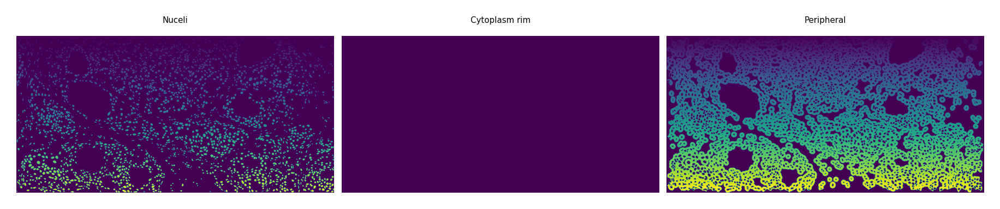

In [ ]:
# Display
matplotlib.rcParams.update({'font.size': 3})
fig, axes = plt.subplots(1,3, figsize=(6,6), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(nuclei_cleared)
ax[0].set_title("Nuceli")

ax[1].imshow(cytoplasm_rim_mask)
ax[1].set_title("Cytoplasm rim")

# ax[2].imshow(ihc_e)
# ax[2].set_title("Eosin") 

ax[2].imshow(nuclei_cleared_circumference)
ax[2].set_title("Peripheral")

for a in ax.ravel():
    a.axis('off')

fig.tight_layout()

In [ ]:
print(np.unique(im_gray_clahe_enhanced, return_counts=True))

(array([  0, 255], dtype=uint8), array([ 759343, 5589692]))


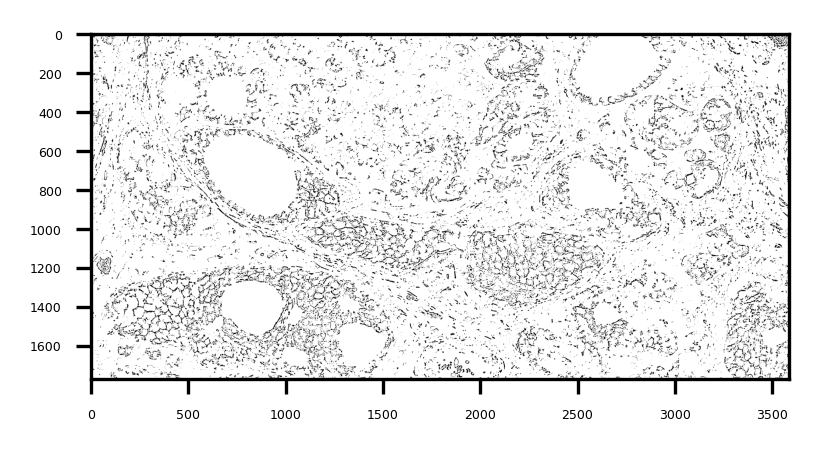

In [ ]:
# Exclude nuclei areas from the DAB thresholded mask
nuclei_cleared_0_255 = np.where(nuclei_cleared > 1, 255, 0)
im_gray_clahe_enhanced = im_gray_clahe_enhanced + nuclei_cleared_0_255
im_gray_clahe_enhanced = np.where(im_gray_clahe_enhanced >255, 255, im_gray_clahe_enhanced)

plt.figure(figsize=(3,3))
plt.imshow(im_gray_clahe_enhanced, cmap = 'gray')
plt.show()

In [ ]:
# im_gray_clahe_enhanced_invert = np.invert(im_gray_clahe_enhanced) + 256

# plt.figure(figsize=(3,3))
# plt.imshow(im_gray_clahe_enhanced_invert, cmap = 'gray')
# plt.show()
# print(np.min(im_gray_clahe_enhanced_invert))
# print(np.max(im_gray_clahe_enhanced_invert))

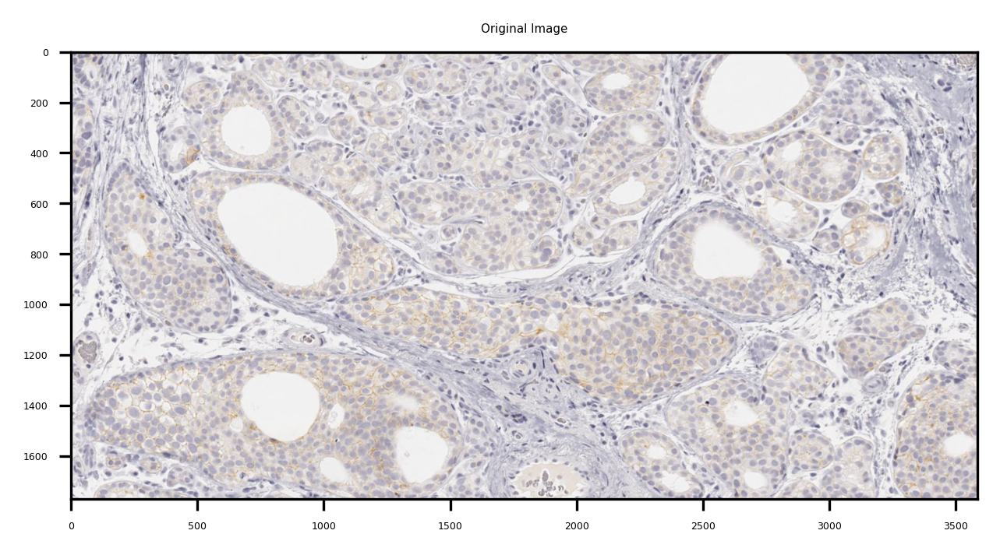

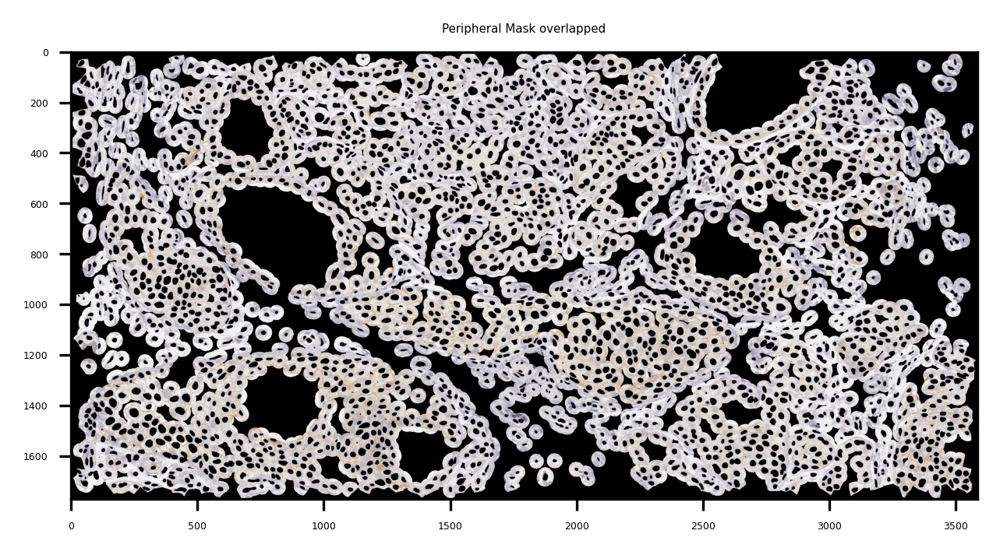

In [ ]:
# Visualing borders on the original image:

binary_nuclei_cleared_circumference = np.where(nuclei_cleared_circumference != 0, 1, 0)

B,G,R = cv2.split(image_auto_corrected)

B = np.multiply(B, binary_nuclei_cleared_circumference)
G = np.multiply(G, binary_nuclei_cleared_circumference)
R = np.multiply(R, binary_nuclei_cleared_circumference)

border_image_mask = cv2.merge([B,G,R])


matplotlib.rcParams.update({'font.size': 3})
plt.figure(figsize=(5,5))
plt.title('Original Image')
plt.imshow(image_auto_corrected)
plt.show()

matplotlib.rcParams.update({'font.size': 3})
plt.figure(figsize=(5,5))
plt.title('Peripheral Mask overlapped')
plt.imshow(border_image_mask)
plt.show()

In [ ]:
from skimage import measure, io, img_as_ubyte
from skimage.color import label2rgb, rgb2gray


image_ = img_as_ubyte(image_.astype(np.uint8))

df_periphery = predict_generate_cell_properties(nuclei_cleared_circumference, image_)
df_periphery = df_periphery.loc[(df_periphery["area"] > 100)]
#df_periphery = df_periphery.drop(labels = ['label'], axis =1)
df_periphery = df_periphery.reset_index()  


index = df_periphery.index
number_of_rows = len(index)
print("Number of elements in the dataframe: ", number_of_rows)

Number of elements in the dataframe:  2574


In [ ]:
df_periphery.tail()

,index,label,area,bbox-0,bbox-1,bbox-2,bbox-3,centroid-0,centroid-1,minor_axis_length,major_axis_length,mean_intensity
2569,2575,2576,559,1713,275,1745,324,1727.536673,298.679785,25.702149,57.499214,39.202147
2570,2576,2577,1044,1713,1581,1745,1639,1728.095785,1608.499042,30.054420,62.725232,22.839080
2571,2577,2578,1030,1714,707,1759,745,1735.672816,727.918447,33.567235,53.975148,35.143689
2572,2578,2579,1636,1715,881,1758,945,1733.998166,910.199878,41.086508,63.600702,40.015281
2573,2579,2580,674,1715,2972,1757,3018,1734.350148,2996.295252,40.848979,48.830158,31.237389


In [ ]:
# Eliminating outlier small/large "objects"
# df_periphery = df_periphery.drop(df_periphery[df_periphery.area  < df_periphery.area.quantile(q = 0.02)].index) # Cell size
# Eliminating Lymphocytes (cutoff point = mean area of all cells / 3)
df_periphery = df_periphery.drop(df_periphery[df_periphery.area  < df_periphery['area'].mean()/3].index)

df_periphery = df_periphery.drop(df_periphery[(df_periphery['major_axis_length']/df_periphery['minor_axis_length']) > 2.5].index)

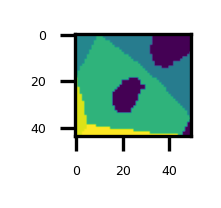

In [ ]:
i = 50


matplotlib.rcParams.update({'font.size': 3})
plt.figure(figsize=(0.5, 0.5))
plt.imshow(nuclei_cleared_circumference[df_periphery['bbox-0'][i]:df_periphery['bbox-2'][i], df_periphery['bbox-1'][i]:df_periphery['bbox-3'][i]])
plt.show()

In [ ]:
df_periphery['label'][i]

51

In [ ]:
filled_in_circumference_mask = nuclei_cleared_circumference + nuclei_cleared + cytoplasm_rim_mask

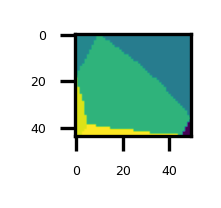

In [ ]:
matplotlib.rcParams.update({'font.size': 3})
plt.figure(figsize=(0.5, 0.5))
plt.imshow(filled_in_circumference_mask[df_periphery['bbox-0'][i]:df_periphery['bbox-2'][i], df_periphery['bbox-1'][i]:df_periphery['bbox-3'][i]])
plt.show()

In [ ]:
# Find the most common element in the filled in mask
most_common_flat = np.ndarray.flatten(filled_in_circumference_mask[df_periphery['bbox-0'][i]:df_periphery['bbox-2'][i], df_periphery['bbox-1'][i]:df_periphery['bbox-3'][i]])
most_common_flat = most_common_flat[most_common_flat != 0]
most_common_element = np.bincount(most_common_flat).argmax()
print(most_common_element)

102


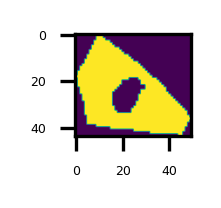

In [ ]:
# Generate a binary mask for the peripheray of each cell
peripheral_cell_mask = np.where(nuclei_cleared_circumference[df_periphery['bbox-0'][i]:df_periphery['bbox-2'][i], df_periphery['bbox-1'][i]:df_periphery['bbox-3'][i]] != most_common_element, 0,1)

matplotlib.rcParams.update({'font.size': 3})
plt.figure(figsize=(0.5, 0.5))
plt.imshow(peripheral_cell_mask)
plt.show()

In [ ]:
def DAB_intensity(image, mask):

    cell_image = image
    cell_mask_normalized = mask
    
    # Color Deconvulation only works on full image, not cropped out region w/ black background
    ihc_hed = rgb2hed(cell_image)

    # Create an RGB image for each of the stains
    null = np.zeros_like(ihc_hed[:, :, 0])
    ihc_h = hed2rgb(np.stack((ihc_hed[:, :, 0], null, null), axis=-1))
    ihc_e = hed2rgb(np.stack((null, ihc_hed[:, :, 1], null), axis=-1))
    ihc_d = hed2rgb(np.stack((null, null, ihc_hed[:, :, 2]), axis=-1))

    ihc_d_norm = (ihc_d * 255).astype(np.uint8)
    ihc_d_gray = cv2.cvtColor(ihc_d_norm, cv2.COLOR_RGB2GRAY) 

    cell_image_merged = np.multiply(ihc_d_gray, cell_mask_normalized)
    ihc_d_flat = np.ndarray.flatten(cell_image_merged)

    # Remove background black pixels (=0) from the calculations
    ihc_d_flat_fg = ihc_d_flat[ihc_d_flat != 0]

    # Total box area - AUC (brightness curve) = AUC for dark pixels
    DAB_index_AUC = (255 * len(ihc_d_flat_fg)) - np.sum(ihc_d_flat_fg)
    Area_2D_image = len(ihc_d_flat_fg)
    DAB_index_AUC_norm =  DAB_index_AUC / Area_2D_image
    DAB_index_AUC_norm_index = DAB_index_AUC_norm / 255

    return DAB_index_AUC_norm_index


In [ ]:
def DAB_edge_index(image, mask):
    """
    Gets image gradient (magnitude) and orientation (angle)
    Args:
        img

    Returns:
        Gradient, orientation
    """
    
    # Color Deconvulation only works on full image, not cropped out region w/ black background
    ihc_hed = rgb2hed(image)

    # Create an RGB image for each of the stains
    null = np.zeros_like(ihc_hed[:, :, 0])
    ihc_h = hed2rgb(np.stack((ihc_hed[:, :, 0], null, null), axis=-1))
    ihc_e = hed2rgb(np.stack((null, ihc_hed[:, :, 1], null), axis=-1))
    ihc_d = hed2rgb(np.stack((null, null, ihc_hed[:, :, 2]), axis=-1))

    ihc_d_norm = (ihc_d * 255).astype(np.uint8)
    ihc_d_gray = cv2.cvtColor(ihc_d_norm, cv2.COLOR_RGB2GRAY) 


    img_gray = np.sqrt(ihc_d_gray)

    gx = cv2.Sobel(np.float32(ihc_d_gray), cv2.CV_32F, 1, 0)
    gy = cv2.Sobel(np.float32(ihc_d_gray), cv2.CV_32F, 0, 1)

    mag, ang = cv2.cartToPolar(gx, gy)

    # mag is a 2D matrix the size of original image, in which each index is a measurments of the "edge"
    cell_membrane_image = mag  * mask

    nonzero_count = np.count_nonzero(mag)

    return cell_membrane_image, np.sum(mag) / nonzero_count


In [ ]:
def Partial_circle_DAB(image, mask):

    quarter_counter = 0
    DAB_circle_gray_60X60 = image 
    mask_crop_60X60 = mask


    mask_crop_60X60_inverted = (np.invert(mask_crop_60X60) + 2) * 255   # create a "square image where the background and the non-DAB signal is the same"
    DAB_pos_pixel_zero_bg_255_60x60 = (DAB_circle_gray_60X60 * mask_crop_60X60) + mask_crop_60X60_inverted

    y, x = np.shape(DAB_pos_pixel_zero_bg_255_60x60)
    cy = int(y/2)
    cx = int(x/2)


    # LUQ = (DAB_intensity(image[:cy , :cx :], mask[:cy , :cx]) >  proposed_stain_threshold)  
    # LLQ = (DAB_intensity(image[cy: , :cx, :], mask[cy: , :cx]) >  proposed_stain_threshold)        
    # RUQ = (DAB_intensity(image[:cy , cx:, :], mask[:cy , cx:]) >   proposed_stain_threshold)        
    # RLQ = (DAB_intensity(image[cy: , cx:, :], mask[cy: , cx:]) >  proposed_stain_threshold)  


    LUQ = 900 - (np.count_nonzero(DAB_pos_pixel_zero_bg_255_60x60[:cy , :cx]))  > 75   # 900 pixels in a quarter of the image minus non-zero bg pixels = DAB pos pixels
    LLQ = 900 - (np.count_nonzero(DAB_pos_pixel_zero_bg_255_60x60[cy: , :cx]))  > 75      
    RUQ = 900 - (np.count_nonzero(DAB_pos_pixel_zero_bg_255_60x60[:cy , cx:]))  > 75    
    RLQ = 900 - (np.count_nonzero(DAB_pos_pixel_zero_bg_255_60x60[cy: , cx:]))  > 75         

    if LUQ == True:
        quarter_counter += 1
    if LLQ == True:
        quarter_counter += 1
    if RUQ == True:
        quarter_counter += 1      
    if RLQ == True:
        quarter_counter += 1


    if quarter_counter == 2 or quarter_counter == 3:
        partial_circle = True
    else:
        partial_circle = False
    

    return partial_circle



In [ ]:
def Full_circle_DAB(image, mask):

    DAB_circle_gray_60X60 = image 
    mask_crop_60X60 = mask


    mask_crop_60X60_inverted = (np.invert(mask_crop_60X60) + 2) * 255   # create a "square image where the background and the non-DAB signal is the same"
    DAB_pos_pixel_zero_bg_255_60x60 = (DAB_circle_gray_60X60 * mask_crop_60X60) + mask_crop_60X60_inverted

    y, x = np.shape(DAB_pos_pixel_zero_bg_255_60x60)
    cy = int(y/2)
    cx = int(x/2)


    # LUQ = (DAB_intensity(image[:cy , :cx :], mask[:cy , :cx]) >  proposed_stain_threshold)  
    # LLQ = (DAB_intensity(image[cy: , :cx, :], mask[cy: , :cx]) >  proposed_stain_threshold)        
    # RUQ = (DAB_intensity(image[:cy , cx:, :], mask[:cy , cx:]) >   proposed_stain_threshold)        
    # RLQ = (DAB_intensity(image[cy: , cx:, :], mask[cy: , cx:]) >  proposed_stain_threshold)  


    LUQ = 900 - (np.count_nonzero(DAB_pos_pixel_zero_bg_255_60x60[:cy , :cx]))  > 75   # 900 pixels in a quarter of the image minus non-zero bg pixels = DAB pos pixels
    LLQ = 900 - (np.count_nonzero(DAB_pos_pixel_zero_bg_255_60x60[cy: , :cx]))  > 75      
    RUQ = 900 - (np.count_nonzero(DAB_pos_pixel_zero_bg_255_60x60[:cy , cx:]))  > 75    
    RLQ = 900 - (np.count_nonzero(DAB_pos_pixel_zero_bg_255_60x60[cy: , cx:]))  > 75         

    if (LUQ == False or LLQ == False) or (RLQ == False or RLQ == False):
        full_circle = False
    else:
        full_circle = True
        

    return full_circle



In [ ]:
HER2_counter = 0
DAB_index_values = []
DAB_edge_index_values = []
Full_Circle_DAB_array = []
Partial_circle_DAB_array = []
proposed_stain_threshold  = 0.10
proposed_edge_threshold = 10

for i in range(len(df_nucleus)):
    
    # calculate standard cropbox around each nucleus
    box_y_up = int(df_nucleus['centroid-0'][i]) - 30
    box_y_down = int(df_nucleus['centroid-0'][i]) + 30
    box_x_left = int(df_nucleus['centroid-1'][i]) - 30
    box_x_right = int(df_nucleus['centroid-1'][i]) + 30

    Y_original_image, _, _ = np.shape(image_auto_corrected)
    _, X_original_image, _ = np.shape(image_auto_corrected)
    
    if (box_y_up > 0 and box_x_left > 0) and (box_y_down < Y_original_image and box_x_right < X_original_image):

        # Crop out standard box out of original image
        image_crop_60X60 = image_auto_corrected [box_y_up:box_y_down, box_x_left:box_x_right, :]
        DAB_circle_gray_60X60 = im_gray_clahe_enhanced [box_y_up:box_y_down, box_x_left:box_x_right]
        border_image_mask_60X60 = border_image_mask [box_y_up:box_y_down, box_x_left:box_x_right]
        

        # create the binary mask for the cell's periphery; cell identified by the value of the index at the center of the cell pose nucleus mask
        # mask_crop_60X60 = np.where(nuclei_cleared_circumference[box_y_up:box_y_down, box_x_left:box_x_right] == nuclei_cleared[int(df_nucleus['centroid-0'][i]),int(df_nucleus['centroid-1'][i])], 1,0)
        mask_crop_60X60_nucleus = np.where(nuclei_cleared[box_y_up:box_y_down, box_x_left:box_x_right] == nuclei_cleared[int(df_nucleus['centroid-0'][i]),int(df_nucleus['centroid-1'][i])], 1,0)    
        mask_crop_60X60_dilated = expand_labels(mask_crop_60X60_nucleus, distance= int(diams+1))
        mask_crop_60X60 = mask_crop_60X60_dilated - expand_labels(mask_crop_60X60_nucleus, distance = 1)
        


        # Calculate the DAB_edge index and DAB_intensity index for each cell (inside the peripheral zone only)    
        DAB_intensity_image = DAB_intensity(image_crop_60X60, mask_crop_60X60)
        edge_matrix, DAB_edge_image = DAB_edge_index(image_crop_60X60, mask_crop_60X60)
        Full_Circle_DAB_ = Full_circle_DAB (DAB_circle_gray_60X60, mask_crop_60X60)
        Partial_circle_DAB_ = Partial_circle_DAB (DAB_circle_gray_60X60, mask_crop_60X60)


        # Store results in numpy array
        DAB_index_values = np.append(DAB_index_values, DAB_intensity_image)
        DAB_edge_index_values = np.append(DAB_edge_index_values, DAB_edge_image)
        Full_Circle_DAB_array = np.append(Full_Circle_DAB_array, Full_Circle_DAB_)
        Partial_circle_DAB_array = np.append(Partial_circle_DAB_array, Partial_circle_DAB_)


        if (DAB_edge_image > proposed_edge_threshold and DAB_intensity_image > proposed_stain_threshold) and Full_Circle_DAB_:
            HER2_counter += 1
            print("\n")
            print("Full circle?: ", Full_Circle_DAB_)
            print("DAB_edge_index: ", DAB_edge_image)
            print("DAB_index: ", DAB_intensity(image_crop_60X60, mask_crop_60X60))

            #np.save('/content/drive/MyDrive/HER2 Warwick Dataset/Positive_60x60/image_{}.npy'.format(HER2_counter), image_crop_60X60)

            matplotlib.rcParams.update({'font.size': 3})
            fig, axes = plt.subplots(1,3, figsize=(2, 2), sharex=True, sharey=True)
            ax = axes.ravel()

            ax[0].imshow(image_crop_60X60)
            ax[0].set_title("Cell_RGB")

            ax[1].imshow(edge_matrix, cmap = 'gray')
            ax[1].set_title("Edges")

            ax[2].imshow((DAB_circle_gray_60X60 * mask_crop_60X60) , cmap = 'gray')
            ax[2].set_title("DAB_circle_gray")


            # mask_crop_60X60_inverted = (np.invert(mask_crop_60X60) + 2) * 255   # create a "square image where the background and the non-DAB signal is the same"
            # DAB_pos_pixel_zero_bg_255_60x60 = (DAB_circle_gray_60X60 * mask_crop_60X60) + mask_crop_60X60_inverted
            # ax[3].imshow(DAB_pos_pixel_zero_bg_255_60x60, cmap = 'gray')
            # ax[3].set_title("for full circle quant.")

            plt.show()


In [ ]:
# Add calculated index to the dataframe
df_periphery['DAB_edge_index'] = pd.Series(DAB_edge_index_values) 
df_periphery['DAB_edge_index'] = df_periphery['DAB_edge_index'].fillna(0)        # Replace Nan values with =0

df_periphery['DAB_index'] = pd.Series(DAB_index_values) 
df_periphery['DAB_index'] = df_periphery['DAB_index'].fillna(0)        # Replace Nan values with =0

df_periphery['Full_Circle_DAB'] = pd.Series(Full_Circle_DAB_array) 
df_periphery['Full_Circle_DAB'] = df_periphery['Full_Circle_DAB'].fillna(0)        # Replace Nan values with =0

df_periphery['Partial_circle_DAB'] = pd.Series(Partial_circle_DAB_array) 
df_periphery['Partial_circle_DAB'] = df_periphery['Partial_circle_DAB'].fillna(0)        # Replace Nan values with =0


In [ ]:
df_HER2_Pos__ = df_periphery[df_periphery['DAB_edge_index'] > proposed_edge_threshold]
df_HER2_Pos_ = df_HER2_Pos__ [df_HER2_Pos__ ['DAB_index'] > proposed_stain_threshold]
df_HER2_Pos = df_HER2_Pos_ [df_HER2_Pos_ ['Full_Circle_DAB'] == True]
df_HER2_Pos  = df_HER2_Pos.reset_index(drop=True)  

In [ ]:
df_HER2_Pos

,index,label,area,bbox-0,bbox-1,bbox-2,bbox-3,centroid-0,centroid-1,minor_axis_length,major_axis_length,mean_intensity,DAB_edge_index,DAB_index,Full_Circle_DAB,Partial_circle_DAB
0,4,5,2283,6,1364,57,1435,28.344284,1396.672361,46.682161,75.478919,30.031537,14.982521,0.109650,1.0,0.0
1,209,210,1100,144,1299,193,1340,167.312727,1314.375455,35.783215,48.674087,27.637273,17.967481,0.104165,1.0,0.0
2,218,219,597,152,3098,198,3122,172.298157,3110.871022,23.713913,52.997601,33.056951,18.753219,0.103212,1.0,1.0
3,236,237,1232,165,1321,208,1376,186.693994,1349.860390,33.480840,56.609070,20.258929,15.967821,0.115141,1.0,0.0
4,297,298,2336,202,1322,265,1377,234.114298,1350.275257,52.664987,65.084811,26.717894,18.967551,0.107593,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
282,2479,2480,699,1654,55,1695,89,1670.226037,71.336195,32.186961,45.567855,30.738197,27.898315,0.109015,1.0,0.0
283,2525,2526,793,1680,3463,1739,3506,1711.313997,3482.865069,32.555771,71.536290,28.175284,17.646953,0.110360,1.0,0.0
284,2561,2562,628,1703,450,1733,493,1718.781847,475.238854,33.656680,44.596986,35.893312,28.548625,0.154314,1.0,0.0
285,2568,2569,1370,1706,738,1754,784,1730.690511,759.650365,43.452692,49.605582,32.143796,13.514420,0.106396,1.0,0.0


In [ ]:
print("Her2+ full circle cells = ", len(df_HER2_Pos))
print("Her2 partial staining = ", len(df_periphery[df_periphery['Partial_circle_DAB'] == True]))
print("Total cells = ", len(df_periphery))
print("\n")

print('HER2 Complete staining precentage  = {}%'.format(np.round(100 * len(df_HER2_Pos)/len(df_periphery), decimals=1)))



print("     HER2 complete STRONG staining = {}%".format(np.round(100 * len(df_HER2_Pos[df_HER2_Pos['DAB_index'] > 0.2])/len(df_periphery), decimals=1)))
print("     HER2 complete WEAK staining = {}%".format(np.round(100 * len(df_HER2_Pos[df_HER2_Pos['DAB_index'] < 0.2])/len(df_periphery), decimals=1)))
print("\n")
print('HER2 Partial staining precentage  = {}%'.format(np.round(100 * len(df_periphery[df_periphery['Partial_circle_DAB'] == True])/len(df_periphery), decimals=1)))

Her2+ full circle cells =  287
Her2 partial staining =  734
Total cells =  2464


HER2 Complete staining precentage  = 11.6%
     HER2 complete STRONG staining = 0.0%
     HER2 complete WEAK staining = 11.6%


HER2 Partial staining precentage  = 29.8%


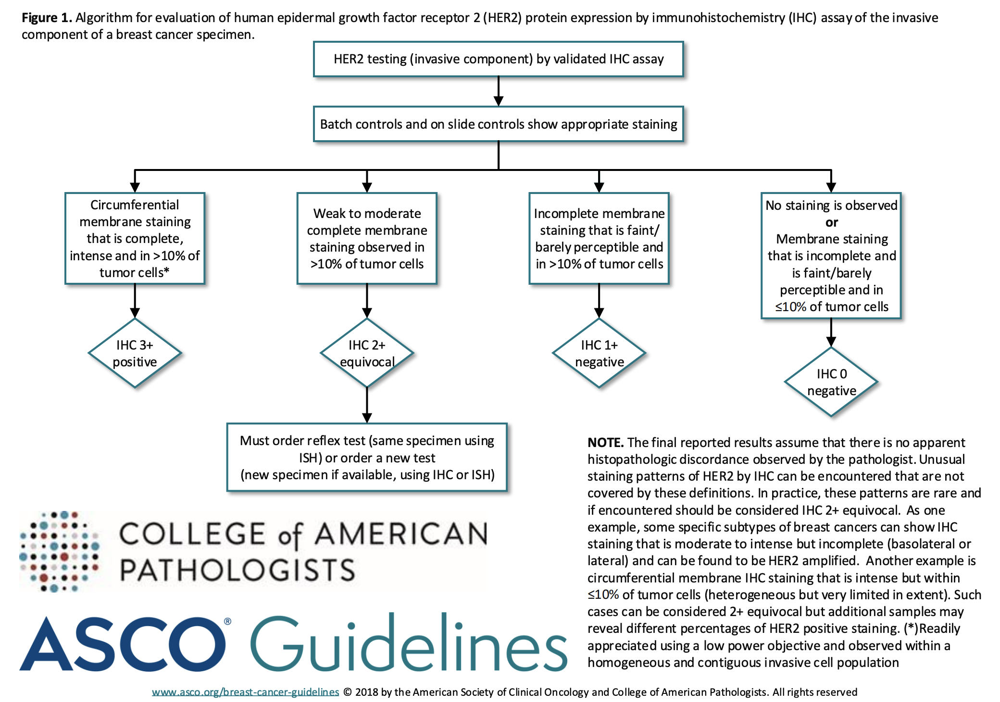

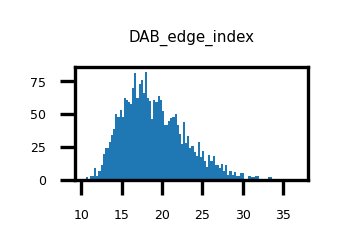

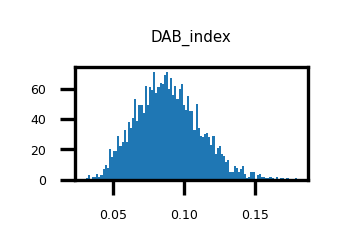

In [ ]:
# Display
plt.figure(figsize=(1,0.5))
plt.hist(df_periphery['DAB_edge_index'], bins = 100)
plt.title("DAB_edge_index")
plt.show()

plt.figure(figsize=(1,0.5))
plt.hist(df_periphery['DAB_index'], bins = 100)
plt.title("DAB_index")
plt.show()
